In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [29]:
df=pd.read_csv("Dataset .csv")

# RESTAURANTS RATINGS

In [30]:
Aggregate_ratings = df["Aggregate rating"]
rating_counts = Aggregate_ratings.value_counts().sort_index()

In [31]:
rating_counts

Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64

In [32]:
most_commomn_rating_range = rating_counts.idxmax()
print("Most common rating range : ",most_commomn_rating_range)

Most common rating range :  0.0


In [33]:
average_votes = df["Votes"].mean()
print("Average number of votes received by restaurants : ",average_votes)

Average number of votes received by restaurants :  156.909747670401


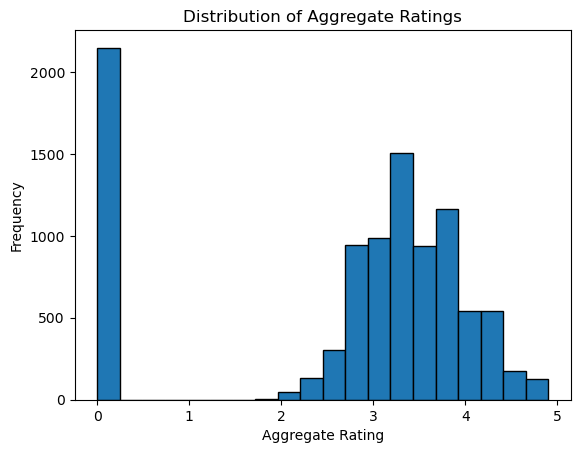

In [34]:
plt.hist(Aggregate_ratings , bins = 20 , edgecolor = "black")
plt.xlabel("Aggregate Rating")
plt.ylabel("Frequency")
plt.title("Distribution of Aggregate Ratings")
plt.show()

# CUISINE COMBINATION

In [35]:
cuisines = df["Cuisines"]
aggregate_ratings = df["Aggregate rating"]

In [36]:
cuisines_combination_counts = cuisines.value_counts()

In [37]:
cuisines_combination_counts

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64

In [38]:
most_common_cuisines_combination = cuisines_combination_counts.head(10)
print("Most Common Cuisines combinations : ")
print(most_common_cuisines_combination)

Most Common Cuisines combinations : 
Cuisines
North Indian                      936
North Indian, Chinese             511
Chinese                           354
Fast Food                         354
North Indian, Mughlai             334
Cafe                              299
Bakery                            218
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Street Food                       149
Name: count, dtype: int64


In [39]:
cuisines_combination_average_rating = df.groupby("Cuisines")["Aggregate rating"].mean()

In [40]:
cuisines_combination_average_rating

Cuisines
Afghani                                      0.725
Afghani, Mughlai, Chinese                    0.000
Afghani, North Indian                        0.000
Afghani, North Indian, Pakistani, Arabian    0.000
African                                      4.700
                                             ...  
Western, Asian, Cafe                         4.200
Western, Fusion, Fast Food                   3.200
World Cuisine                                4.900
World Cuisine, Mexican, Italian              4.400
World Cuisine, Patisserie, Cafe              4.200
Name: Aggregate rating, Length: 1825, dtype: float64

In [41]:
top_10_avg_ratings  = cuisines_combination_average_rating.nlargest(10)
print("Average ratings for the top 10 cuisine combinations : ")
print(top_10_avg_ratings)

Average ratings for the top 10 cuisine combinations : 
Cuisines
American, BBQ, Sandwich         4.9
American, Burger, Grill         4.9
American, Caribbean, Seafood    4.9
American, Coffee and Tea        4.9
American, Sandwich, Tea         4.9
BBQ, Breakfast, Southern        4.9
Burger, Bar Food, Steak         4.9
Continental, Indian             4.9
European, Asian, Indian         4.9
European, Contemporary          4.9
Name: Aggregate rating, dtype: float64


# GEOGRAPHIC ANALYSIS

In [42]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [43]:
import folium
from IPython.display import display
from sklearn.cluster import KMeans

In [44]:
restaurant_names = df["Restaurant Name"]
latitude = df["Latitude"]
longitude = df["Longitude"]

In [45]:
X = df[["Latitude","Longitude"]]
num_clusters = 5

In [47]:
kmeans = KMeans(n_clusters=num_clusters,random_state=42)
df["Cluster"]=kmeans.fit_predict(X)

C:\Users\Ruchi Kumari\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [48]:
map_center = [latitude.mean(),longitude.mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=12)

In [49]:
cluster_colors = ["red" , "blue" , "green" , "purple" , "orange"]

In [52]:
for index, row in df.iterrows():
    restaurant_name = row["Restaurant Name"]
    latitude = row["Latitude"]
    longitude = row["Longitude"]
    cuisines = row["Cuisines"]
    rating = row["Aggregate rating"]
    cluster = row["Cluster"]
    
    popup_text = f"Restaurant: {restaurant_name} \nCuisines: {cuisines}\nRating {rating}"
    marker = folium.Marker([latitude, longitude] , popup=popup_text)
    marker.add_to(restaurant_map)

In [54]:
display(restaurant_map)

# RESTAURANT CHAINS

In [55]:
restaurant_chains = df.groupby("Restaurant Name").size().reset_index(name="Chain Count")
restaurant_chains = restaurant_chains[restaurant_chains["Chain Count"]>1]

In [56]:
restaurant_chains = restaurant_chains.sort_values(by="Chain Count",ascending=False)

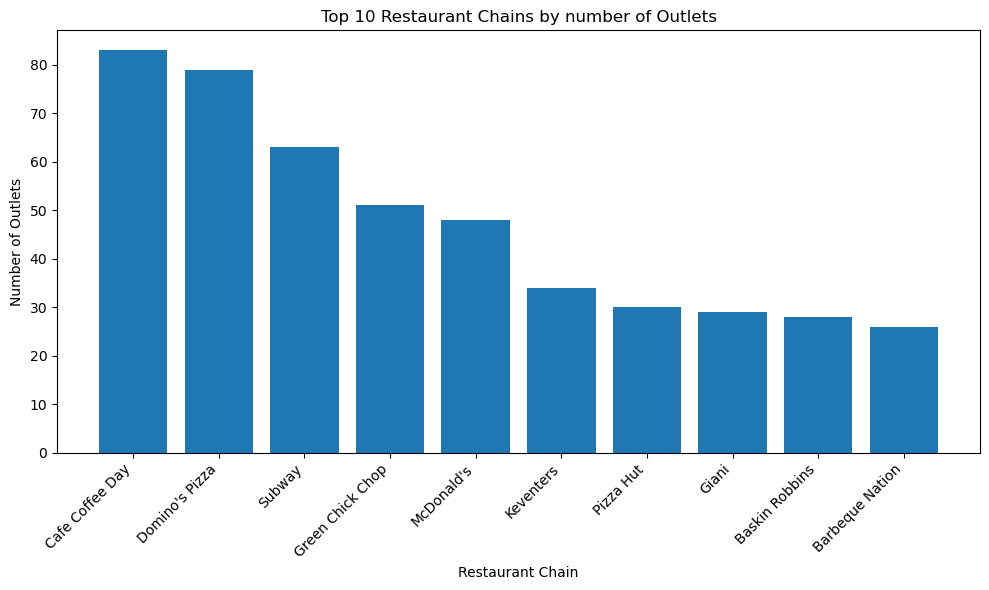

In [57]:
plt.figure(figsize=(10,6))
plt.bar(restaurant_chains["Restaurant Name"][:10],restaurant_chains["Chain Count"][:10])
plt.xticks(rotation=45,ha="right")
plt.xlabel("Restaurant Chain")
plt.ylabel("Number of Outlets")
plt.title("Top 10 Restaurant Chains by number of Outlets")
plt.tight_layout()
plt.show()


In [60]:
chain_ratings=df.groupby("Restaurant Name")["Aggregate rating"].mean().reset_index(name="Average Rating")
chain_votes=df.groupby("Restaurant Name")["Votes"].sum().reset_index(name="Total Votes")

In [62]:
chain_analysis = pd.merge(chain_ratings,chain_votes,on="Restaurant Name")

In [64]:
chain_analysis = chain_analysis.sort_values(by="Average Rating", ascending=False)

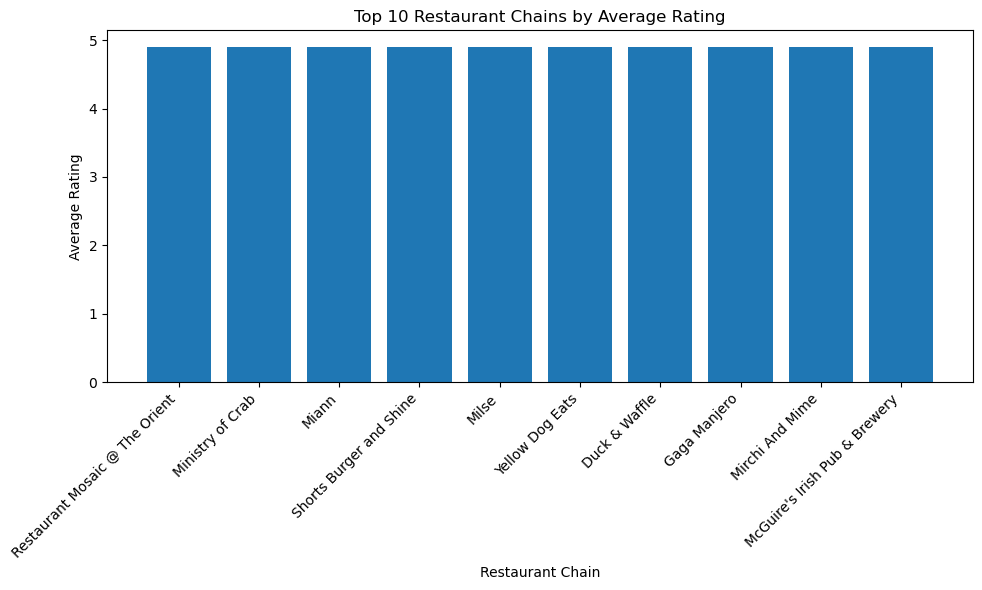

In [65]:
plt.figure(figsize=(10,6))
plt.bar(chain_analysis["Restaurant Name"][:10],chain_analysis["Average Rating"][:10])
plt.xticks(rotation=45,ha="right")
plt.xlabel("Restaurant Chain")
plt.ylabel("Average Rating")
plt.title("Top 10 Restaurant Chains by Average Rating")
plt.tight_layout()
plt.show()